# <h1> Data Collection and Anotation</h1>

In [ ]:
#Code that ran locally in order to gather all of the images.
import os
import cv2
import time
import uuid

IMAGE_PATH='CollectedImages'

labels=['Hello','Yes','No','Thanks','IloveYou']

number_of_images=20

for label in labels:
    img_path = os.path.join(IMAGE_PATH, label)
    os.makedirs(img_path)
    cap=cv2.VideoCapture(0)
    print('Collecting images for {}'.format(label))
    time.sleep(5)
    for imgnum in range(number_of_images):
        ret,frame=cap.read()
        imagename=os.path.join(IMAGE_PATH,label,label+'.'+'{}.jpg'.format(str(uuid.uuid1())))
        cv2.imwrite(imagename,frame)
        cv2.imshow('frame',frame)
        time.sleep(2)

        if cv2.waitKey(1) & 0xFF==ord('q'):
            break
    cap.release()

#I manually set on the picture boundry boxes using labelImg.

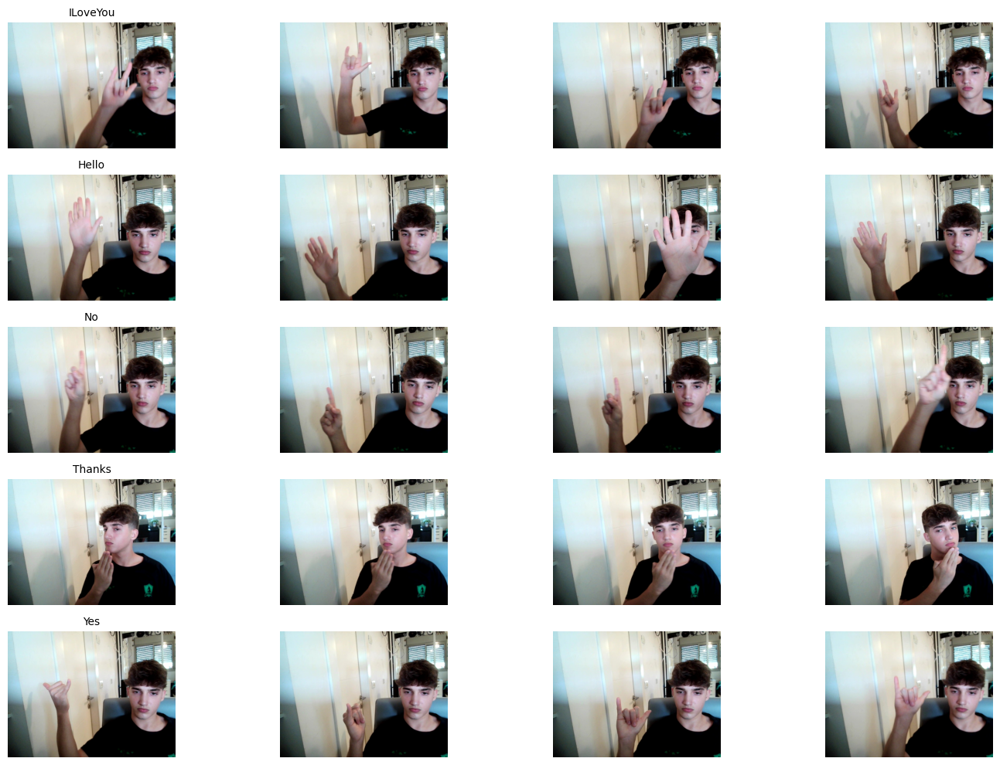

In [4]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# Path to the main directory
main_dir = '/content/drive/MyDrive/Sign_Language_Detection_Project/Data/CollectedImages'

# List of folders
folders = ['ILoveYou', 'Hello', 'No', 'Thanks', 'Yes']

# Set up the figure
fig = plt.figure(figsize=(15, 10))

# Iterate through each folder
for i, folder in enumerate(folders):
    # Path to the current folder
    folder_path = os.path.join(main_dir, folder)

    # List of files in the folder
    files = os.listdir(folder_path)

    # Randomly select 4 files
    selected_files = random.sample(files, 4)

    # Display the images
    for j, file_name in enumerate(selected_files):
        file_path = os.path.join(folder_path, file_name)
        image = Image.open(file_path)

        # Add a subplot for each image
        ax = fig.add_subplot(5, 4, i*4 + j + 1)
        ax.imshow(image)
        ax.axis('off')
        if j == 0:
            ax.set_title(folder, fontsize=10)

plt.tight_layout()
plt.show()


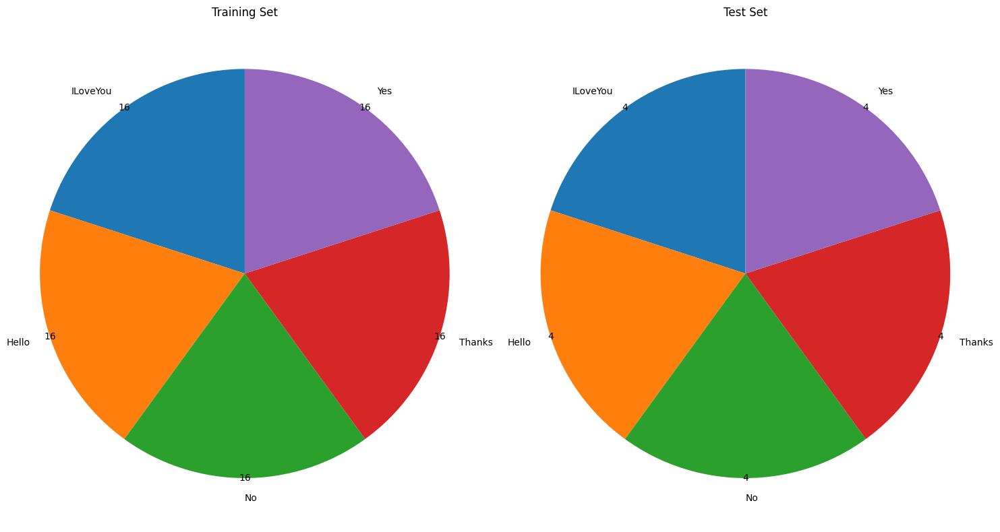

In [8]:
import matplotlib.pyplot as plt

# List of folders representing different sign types
FOLDERS = ['ILoveYou', 'Hello', 'No', 'Thanks', 'Yes']

# Number of examples per sign type
examples_per_sign = 20

# Calculate the total number of examples
total_examples = len(FOLDERS) * examples_per_sign

# Calculate the number of examples in the training and test sets
train_examples = int(total_examples * 0.8)
test_examples = total_examples - train_examples

# Calculate the number of examples per sign type in the training and test sets
train_examples_per_sign = int(train_examples / len(FOLDERS))
test_examples_per_sign = int(test_examples / len(FOLDERS))

# Data for plotting
sizes_train = [train_examples_per_sign] * len(FOLDERS)
sizes_test = [test_examples_per_sign] * len(FOLDERS)
labels = FOLDERS

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))

# Plot the training set
wedges_train, _ = ax1.pie(sizes_train, labels=labels, startangle=90)
ax1.set_title('Training Set')

# Add the count of each sign type in the center of the pie chart
for i, (label, wedge) in enumerate(zip(labels, wedges_train)):
    ang = (wedge.theta2 - wedge.theta1)/2. + wedge.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    ax1.text(x, y, sizes_train[i], va='center', ha='center')

# Plot the test set
wedges_test, _ = ax2.pie(sizes_test, labels=labels, startangle=90)
ax2.set_title('Test Set')

# Add the count of each sign type in the center of the pie chart
for i, (label, wedge) in enumerate(zip(labels, wedges_test)):
    ang = (wedge.theta2 - wedge.theta1)/2. + wedge.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    ax2.text(x, y, sizes_test[i], va='center', ha='center')

# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')
ax2.axis('equal')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


# <h1> Installing Necceseties</h1>

In [ ]:
%cd /content/drive/MyDrive/Sign_Language_Detection_Project

#clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5.git

#install dependencies
%cd yolov5

In [ ]:
%cd /content/drive/MyDrive/Sign_Language_Detection_Project/yolov5

!pip install -r requirements.txt
import torch
from IPython.display import Image, clear_output

print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties))

/content/drive/MyDrive/Sign_Language_Detection_Project/yolov5
Setup complete. Using torch 2.2.1+cu121 <function get_device_properties at 0x7debe3f08700>


In [ ]:
%cd /content/drive/MyDrive/Sign_Language_Detection_Project/Data/final_data
%cat data.yaml

/content/drive/MyDrive/Sign_Language_Detection_Project/Data/final_data
train: ../train/images
val: ../test/images

nc: 5
names: ['Hello', 'ILoveYou', 'No', 'Thanks', 'Yes']

# <h1> Define Model Configuration and Architecture</h1>

In [ ]:
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
num_classes

'5'

In [ ]:
%cat /content/drive/MyDrive/Sign_Language_Detection_Project/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 80 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 

In [ ]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/drive/MyDrive/Sign_Language_Detection_Project/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.33  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],
   [-1, 1, Conv, [128, 3, 2]],
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone p4
   [-1, 3, BottleneckCSP, [512, False]],

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone p3
   [-1, 3, BottleneckCSP, [256, False]],

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head p4
   [-1, 3, BottleneckCSP, [512, False]],  # 512x1x1

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head p5
   [-1, 3, BottleneckCSP, [1024, False]],  # 1024x1x1

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
   ]



# <h1> Train Custom YOLOv5 Detector

In [ ]:
%%time
%cd /content/drive/MyDrive/Sign_Language_Detection_Project/yolov5
!python train.py --img 416 --batch 16 --epochs 300 --data '/content/drive/MyDrive/Sign_Language_Detection_Project/Data/final_data/data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '/content/drive/MyDrive/Sign_Language_Detection_Project/yolov5/models/yolov5s.pt' --name yolov5s_results  --cache

/content/drive/MyDrive/Sign_Language_Detection_Project/yolov5
2024-04-18 15:48:55.069224: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-18 15:48:55.069284: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-18 15:48:55.070825: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=/content/drive/MyDrive/Sign_Language_Detection_Project/yolov5/models/yolov5s.pt, cfg=./models/custom_yolov5s.yaml, data=/content/drive/MyDrive/Sign_Language_Detection_Project/Data/final_data/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=16, imgsz=416, rect=False, 

# <h1>Evaluate Custom YOLOv5 Detector Performance

In [26]:
print(model)

AutoShape(
  (model): DetectMultiBackend(
    (model): DetectionModel(
      (model): Sequential(
        (0): Focus(
          (conv): Conv(
            (conv): Conv2d(12, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (act): SiLU(inplace=True)
          )
        )
        (1): Conv(
          (conv): Conv2d(24, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (act): SiLU(inplace=True)
        )
        (2): BottleneckCSP(
          (cv1): Conv(
            (conv): Conv2d(48, 24, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv2): Conv2d(48, 24, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (cv3): Conv2d(24, 24, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (cv4): Conv(
            (conv): Conv2d(48, 48, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (bn): BatchNorm2d(48, eps=0.001, momentum=0.03, affine=True, track_running_stats=

In [32]:
import networkx as nx
import matplotlib.pyplot as plt

# Define the layers of the model
layers = [
    "Focus (12, 24)",
    "Conv (24, 48)",
    "BottleneckCSP (48, 24, 48, 24, 24, 48)",
    "Conv (48, 88)",
    "BottleneckCSP (88, 44, 88, 44, 44, 88)",
    "Conv (88, 176)",
    "BottleneckCSP (176, 88, 176, 88, 88, 176)",
    "Conv (176, 344)",
    "SPP (344, 172, 688, 344)",
    "BottleneckCSP (344, 172, 344, 172, 172, 344)",
    "Conv (344, 176)",
    "Upsample",
    "Concat",
    "BottleneckCSP (352, 88, 352, 88, 88, 176)",
    "Conv (176, 88)",
    "Upsample",
    "Concat",
    "BottleneckCSP (176, 44, 176, 44, 44, 88)",
    "Conv (88, 88)",
    "Upsample",
    "Concat",
    "BottleneckCSP (176, 88, 176, 88, 88, 176)",
    "Conv (176, 176)",
    "Upsample",
    "Concat",
    "BottleneckCSP (352, 172, 352, 172, 172, 344)",
    "Detect (88, 176, 344)"
]

# Create a graph
G = nx.Graph()

# Add nodes for each layer
for i, layer in enumerate(layers):
    G.add_node(layer)

# Draw the graph
plt.figure(figsize=(15, 10))
nx.draw(G, with_labels=True, node_size=2000, node_color='lightblue', font_size=8, font_weight='bold')
plt.title('YOLOv5 Model Architecture')
plt.show()


In [33]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
!nvidia-smi

Thu Apr 18 15:58:16 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla V100-SXM2-16GB           Off | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P0              24W / 300W |      2MiB / 16384MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

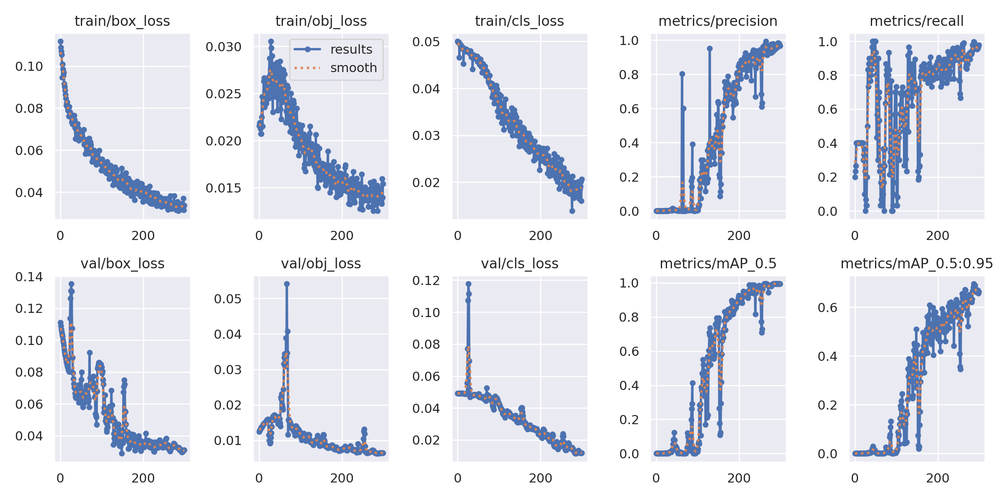

In [ ]:
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/drive/MyDrive/Sign_Language_Detection_Project/yolov5/runs/train/yolov5s_results3/results.png', width=1000)  # view results.png

GROUND TRUTH TRAINING DATA:


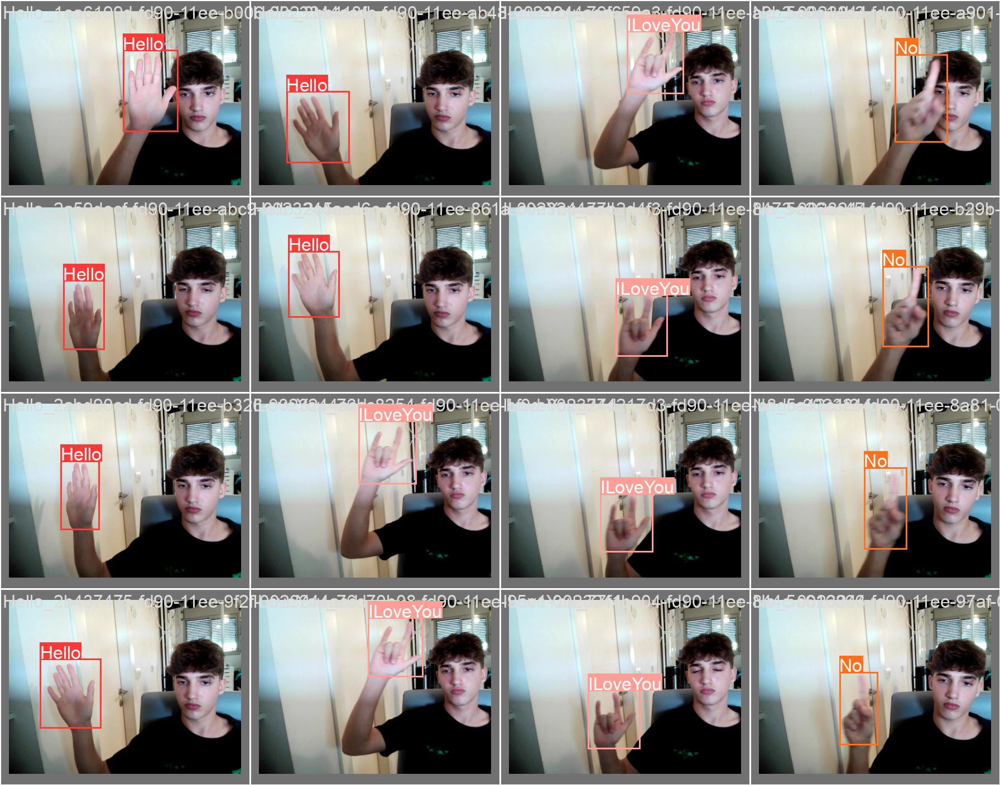

In [ ]:
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/drive/MyDrive/Sign_Language_Detection_Project/yolov5/runs/train/yolov5s_results3/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


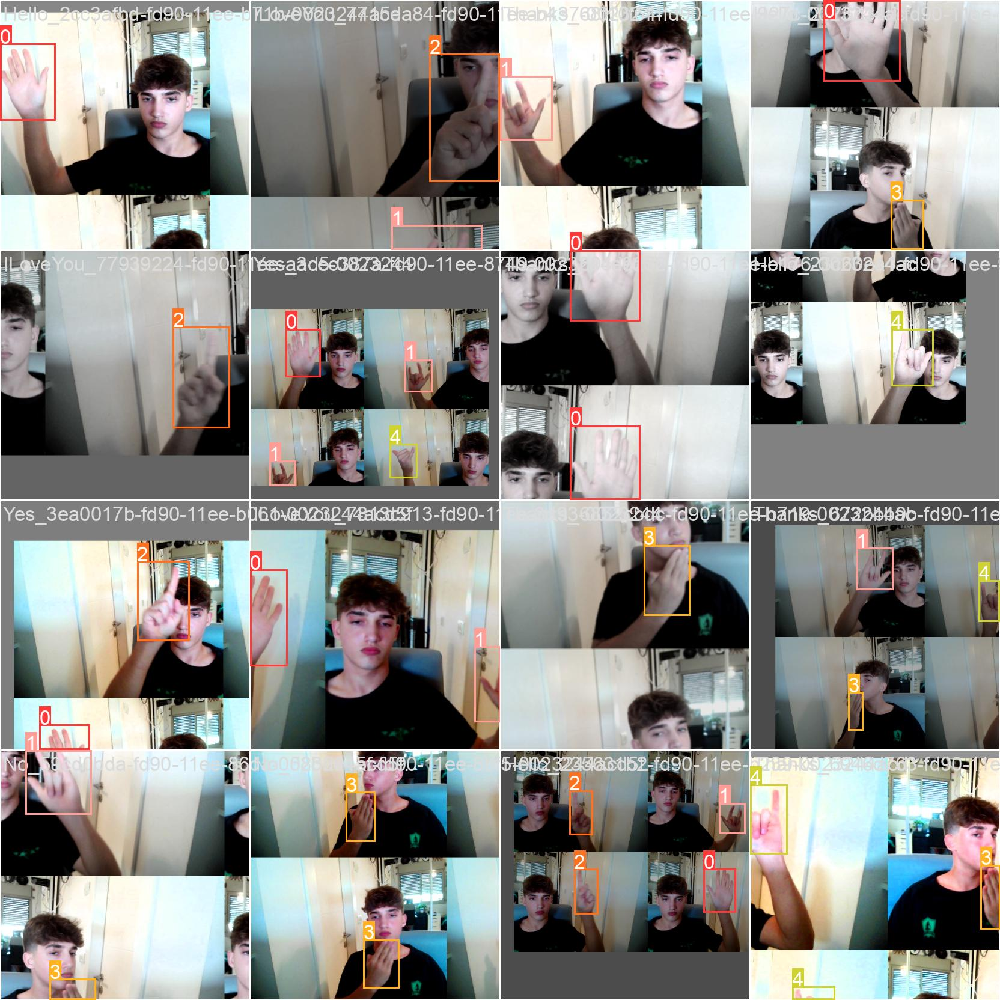

In [ ]:
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/drive/MyDrive/Sign_Language_Detection_Project/yolov5/runs/train/yolov5s_results3/train_batch0.jpg', width=900)

# <h1>Run Inference With Trained Weights</h1>

In [ ]:
%ls /content/drive/MyDrive/Sign_Language_Detection_Project/yolov5/runs/train/yolov5s_results3/weights

best.pt  last.pt


In [ ]:
%cd /content/drive/MyDrive/Sign_Language_Detection_Project/yolov5
!python detect.py --weights /content/drive/MyDrive/Sign_Language_Detection_Project/yolov5/runs/train/yolov5s_results3/weights/best.pt --img 416 --conf 0.5 --source /content/drive/MyDrive/Sign_Language_Detection_Project/Data/final_data/test/images

/content/drive/MyDrive/Sign_Language_Detection_Project/yolov5
detect: weights=['/content/drive/MyDrive/Sign_Language_Detection_Project/yolov5/runs/train/yolov5s_results3/weights/best.pt'], source=/content/drive/MyDrive/Sign_Language_Detection_Project/Data/final_data/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-304-g22361691 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 3367862 parameters, 0 gradients
image 1/30 /content/drive/MyDrive/Sign_Language_Detection_Project/Data/final_data/test/images/Hello_1ea6199d-fd90-11ee-b00

# <h1>Export Trained Weights For Future Inference

In [ ]:
%cp /content/drive/MyDrive/Sign_Language_Detection_Project/yolov5/runs/train/yolov5s_results3/weights/best.pt /content/drive/MyDrive/Sign_Language_Detection_Project/model

# <h1>Interface for the Model</h1>

In [15]:
!pip install torch torchviz

  Preparing metadata (setup.py) ... done
  Created wheel for torchviz: filename=torchviz-0.0.2-py3-none-any.whl size=4132 sha256=2c4b0471ccf339c4627767dcf38a2bcd688ebf25a2bd1c5e27e7d1ea86b90675
  Stored in directory: /root/.cache/pip/wheels/4c/97/88/a02973217949e0db0c9f4346d154085f4725f99c4f15a87094
Successfully built torchviz


In [25]:
%cd /content/drive/MyDrive/Sign_Language_Detection_Project/yolov5

import torch

# Load the YOLOv5 model
model = torch.hub.load('.', 'custom', path='/content/drive/MyDrive/Sign_Language_Detection_Project/best.pt', source='local')


YOLOv5 🚀 v7.0-304-g22361691 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 


/content/drive/MyDrive/Sign_Language_Detection_Project/yolov5


custom_YOLOv5s summary: 182 layers, 3367862 parameters, 0 gradients
Adding AutoShape... 


TypeError: DetectMultiBackend.forward() missing 1 required positional argument: 'im'

In [ ]:
!pip install gradio

In [ ]:
import os
from PIL import Image
import gradio as gr
import uuid
import cv2
import numpy as np

# Function to perform object detection on the uploaded image
def detect_objects(image):
    # Convert the image from PIL to OpenCV format
    image = np.array(image)

    # Perform detection
    results = model(image)

    # Convert the image from BGR to RGB color space
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Draw bounding boxes on the image
    for detection in results.xyxy[0]:
        class_id = int(detection[5])
        class_name = model.names[class_id]
        confidence = float(detection[4])

        x1, y1, x2, y2 = map(int, detection[:4])

        # Customize bounding box appearance
        box_color = (0, 255, 0)  # Green color
        box_thickness = 2
        cv2.rectangle(image_rgb, (x1, y1), (x2, y2), box_color, box_thickness)

        # Customize label appearance
        label_text = f'{class_name}: {confidence:.2f}'
        label_background_color = (0, 255, 0)  # Green color
        label_text_color = (255, 255, 255)  # White color
        label_font = cv2.FONT_HERSHEY_SIMPLEX
        label_font_scale = 0.7
        label_thickness = 2

        # Calculate text size
        (text_width, text_height), _ = cv2.getTextSize(label_text, label_font, label_font_scale, label_thickness)

        # Draw label background
        cv2.rectangle(image_rgb, (x1, y1 - text_height - 10), (x1 + text_width, y1), label_background_color, cv2.FILLED)

        # Draw label text
        cv2.putText(image_rgb, label_text, (x1, y1 - 5), label_font, label_font_scale, label_text_color, label_thickness)

    # Convert the image back to PIL format
    image_pil = Image.fromarray(image_rgb)

    return image_pil

# Create a Gradio interface
input_image = gr.Image(type='pil')
output_image = gr.Image(type='pil')

gr.Interface(
    fn=detect_objects,
    inputs=input_image,
    outputs=output_image,
    title='YOLOv5 Object Detection',
    description='Upload an image and detect objects using YOLOv5'
).launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()

Could not create share link. Please check your internet connection or our status page: https://status.gradio.app.


<IPython.core.display.Javascript object>